In [3]:
import os, sys, json, glob
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime as dt
from matplotlib import animation, rc
from IPython.display import HTML

from elecpy.simulator_monodomain import MonodomainSimulator
from elecpy.simulator_bidomain import BidomainSimulator
from elecpy.util.cmap_bipolar import bipolar
from elecpy.util.loader import Loader
import h5py

pyculib:1: ImportWarning: Numba version too old; expecting 0.33.0


# S1刺激

In [2]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_1/'
    },
    'restart': {'count': 0,
    'source': './test/courtmanche/400pacing_ilca*0.5_ikur*3.0_amp-20_master_2d/'},
    'stimulation': {'membrane': [
         
            {
                'amplitude': 20.0,
                'duration': 5.0,
                'interval': 300,
                'name': 'edge_L',
                'shape': [400, 400],
                'size': 5,
                'start': 0,
                'train': 10
            }
        ]
    },
    'time': {
        u'end': 400,
        u'udt': 0.005
    }
}

In [3]:
step = MonodomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)

elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------400.0/400mselecpy done


In [4]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

# S2刺激

In [5]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_2/'
    },
    'restart': {'count': 150,
    'source': './sim_results/20200309_1/'},
    'stimulation': {'membrane': [
         
            {
                'amplitude': 30.0,
                'duration': 5.0,
                'interval': 300,
                'name': 'edge_B',
                'shape': [400, 400],
                'size': 200,
                'start': 0,
                'train': 1
            }
        ]
    },
    'time': {
        u'end': 300,
        u'udt': 0.005
    }
}

In [6]:
step = MonodomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)

elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------300.0/300mselecpy done


In [7]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

# mono2bi

In [8]:
x = np.ones((400,400))
x =np.where(x == 1, 1.41128048e-03 , 100)

In [9]:
input_file = "./sim_results/20200309_2/out.h5"
with h5py.File(input_file,"a") as f:
    f.create_dataset('0300/phie', data=x)

In [16]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_3/'
    },
    'restart': {'count': 300,
    'source': './sim_results/20200309_2/'},
    'time': {
        u'end': 100,
        u'udt': 0.005
    }
}

In [17]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)

elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------100.0/100mselecpy done


In [18]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

## phie確認

In [19]:
input_file = "./sim_results/20200309_3/out.h5"
with h5py.File(input_file,"r") as f:
    phie= f['0100']['phie'].value
phie

array([[  0.00000000e+00,  -2.52918008e-04,  -6.27108763e-04, ...,
         -8.28184095e-01,  -8.27911789e-01,  -8.27591672e-01],
       [  7.61129387e-04,   5.48135352e-04,   1.91865101e-04, ...,
         -8.26777957e-01,  -8.26577925e-01,  -8.26410289e-01],
       [  2.48169699e-03,   2.27667223e-03,   1.92701736e-03, ...,
         -8.23756247e-01,  -8.23589052e-01,  -8.23455601e-01],
       ..., 
       [  2.86950101e+00,   2.86723610e+00,   2.86218995e+00, ...,
         -4.82731076e+00,  -4.82735316e+00,  -4.82734140e+00],
       [  2.85849333e+00,   2.85614019e+00,   2.85138630e+00, ...,
         -4.83683096e+00,  -4.83676021e+00,  -4.83662698e+00],
       [  2.85254123e+00,   2.85010964e+00,   2.84535937e+00, ...,
         -4.84078513e+00,  -4.84048157e+00,  -4.83980454e+00]])

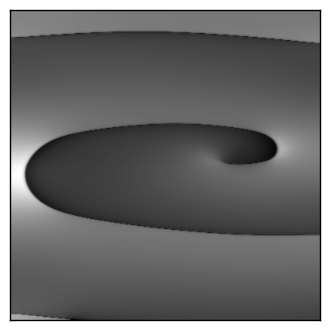

In [21]:
v_min = np.min(phie)
v_max = np.max(phie)
frame = plt.imshow(phie, vmin=v_min, vmax=v_max, cmap='gray')
    #for k in range(19):
    #    plt.plot(elec32[k,1],elec32[k,0],marker='.',color = 'white') 
plt.tick_params(bottom=False,left=False,right=False,top=False)
plt.tick_params(labelbottom=False,labelleft=False,labelright=False,labeltop=False)
plt.show()
 
    # sequence.append([frame])


# master single_stable rotor

In [28]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_4/'
    },
    
    'restart': {'count': 100,
    'source': './sim_results/20200309_3/'},
    'time': {
        u'end': 1000,
        u'udt': 0.005
    }
}

In [29]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)

elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------1000.0/1000mselecpy done


In [31]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

## 複雑化

In [22]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_5/'
    },
    'mask':{'APD_change_ilca':'./ilca_mask3.npy',
            'APD_change_ikur':'./ikur_mask3.npy'
        
    },
    'restart': {'count': 40,
    'source': './sim_results/20200309_3/'},
    'time': {
        u'end': 300,
        u'udt': 0.005
    }
}

In [23]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)

elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------300.0/300mselecpy done


In [24]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

In [25]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_6/'
    },
    
    'restart': {'count': 200,
    'source': './sim_results/20200309_5/'},
    'time': {
        u'end': 1000,
        u'udt': 0.005
    }
}

In [26]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)

elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------1000.0/1000mselecpy done


In [27]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

## meandering single

In [30]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_7/'
    },
    'mask':{'APD_change_ilca':'./ilca_mask6.npy',
            'APD_change_ikur':'./ikur_mask6.npy'
        
    },
    'restart': {'count': 40,
    'source': './sim_results/20200309_3/'},
    'time': {
        u'end': 300,
        u'udt': 0.005
    }
}

In [32]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)

elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------300.0/300mselecpy done


In [33]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

In [34]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_8/'
    },
    
    'restart': {'count': 200,
    'source': './sim_results/20200309_7/'},
    'time': {
        u'end': 1000,
        u'udt': 0.005
    }
}

In [35]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)

elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------1000.0/1000mselecpy done


In [36]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

In [41]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': './sim_results/20200309_9/'
    },
    'mask':{'APD_change_ilca':'./ilca_mask5.npy',
            'APD_change_ikur':'./ikur_mask5.npy'
        
    },
    'restart': {'count': 40,
    'source': './sim_results/20200309_3/'},
    'time': {
        u'end': 1000,
        u'udt': 0.005
    }
}

In [42]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)


elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------1000.0/1000mselecpy done


In [43]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

In [1]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': '/mnt/Share/Temp/kato/sim_results/20200309_10/'
    },
    'mask':{'APD_change_ilca':'./ilca_mask8.npy',
            'APD_change_ikur':'./ikur_mask8.npy'
        
    },
    'restart': {'count': 40,
    'source': '/mnt/Share/Temp/kato/sim_results/20200309_3/'},
    'time': {
        u'end': 400,
        u'udt': 0.005
    }
}

In [4]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)


elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------400.0/400mselecpy done


In [5]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())

In [6]:
sim_params= {
    'cell_type': 'courtmanche',
    'geometory': {
        'ds': 0.015, 'height': 400, 'width': 400
    },
    'log': {
        'cnt': 200,
        'path': '/mnt/Share/Temp/kato/sim_results/20200309_11/'
    },
    'restart': {'count': 150,
    'source': '/mnt/Share/Temp/kato/sim_results/20200309_10/'},
    'time': {
        u'end': 1000,
        u'udt': 0.005
    }
}

In [7]:
step = BidomainSimulator(sim_params).step()
out=[]
while True:
        img = step.next()
        if img is False: break
        out.append(np.copy(img))
del(step)


elecpy simulation start!
Stimulation settings ...done
Allocating data... ...done
Initializing data... ...done
Mask settings... ...done
Building PDE system ... ...done
Main loop start!
------------------1000.0/1000mselecpy done


In [8]:
fig = plt.figure()
plt.axis('off')

ims = []
for img in out:
    im = plt.imshow(
        img.reshape(400,400),
        vmin = -100.0, vmax = 20.0,
        cmap=bipolar(neutral=0, lutsize=1024),
        interpolation='nearest')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims)
HTML(ani.to_html5_video())
